In [84]:
# 9,CongestionWindow
# 17,SmoothedRTT
# 20,RetransmissionTimeout
# 21,SocketSendBufferSize
# 22,SocketSendBufferBytes
# 23,SocketReceiveBufferSize
# 24,SocketReceiveBufferBytes
# 25,UnacknowledgedBytes

# # With ECN and no ECN

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import matplotlib.pyplot as plt
# from gym import wrappers
# from gym import spaces
import math
import random
import re
import os
import sys
import seaborn as sns

# import gym
# import tensorflow as tf
# from tensorflow.keras import layers
col = ['Direction', 'Time', 'LocalIP', 'LocalPort', 'ForeignIP', 'ForeignPort', 'SlowStartThreshold', 'CongestionWindow', 't_flags2', 'SendingWindow', 'ReceiveWindow', 'SendingWindowScalingFactor', 'ReceiveWindowScalingFactor', 'TCPFiniteStateMachine', 'MaximumSegmentSize', 'SmoothedRTT', 'SACKEnabled', 'TCPFlags', 'RetransmissionTimeout', 'SocketSendBufferSize', 'SocketSendBufferBytes', 'SocketReceiveBufferSize', 'SocketReceiveBufferBytes', 'UnacknowledgedBytes', 'ReassemblyQueue', 'Flowid', 'Flowtype']



In [86]:
import re

def contains_1_or_2(input_string):
    if '2' in input_string:
        return 2
    elif '1' in input_string:
        return 1
    else:
        return 0

# Example usage:
test_string = "abc123xyz"
result = contains_1_or_2(test_string)
print("Result:", result)


Result: 2


In [87]:
# plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':100, 'font.size':16})

In [88]:
def functionfilenameandpath(path='./', extension='.log'):
    filepaths = []
    filenames = []

    for root, _, files_list in os.walk(path):
        for file_name in files_list:
            if file_name.endswith(extension):
                file_name_path = os.path.join(root, file_name)
                filenames.append(file_name)
                filepaths.append(file_name_path)

    return filenames, filepaths

In [89]:
folderpath="./datatest1"
filenames,filepaths=functionfilenameandpath(folderpath,'.log')

filepaths.sort()
filenames.sort()
print(filenames)

['fqcodel1_ecn.siftr.log', 'fqcodel1_noecn.siftr.log', 'fqcodel2_ecn.siftr.log', 'fqcodel2_noecn.siftr.log', 'fqpie1_ecn.siftr.log', 'fqpie1_noecn.siftr.log', 'fqpie2_ecn.siftr.log', 'fqpie2_noecn.siftr.log', 'l4s1_ecn.siftr.log', 'l4s1_noecn.siftr.log', 'l4s2_ecn.siftr.log', 'l4s2_noecn.siftr.log']


In [90]:
# for index in range(len(filenames)):
#     print("..................>>>>>>>>>>>>>>>>>")
#     print(filenames[index])
#     print(contains_1_or_2(filenames[index]))
#     print("..................>>>>>>>>>>>>>>>>>")

In [91]:
def remove_outliers_iqr(df, column_name):
    """
    Remove outliers from a specified column in a DataFrame using the IQR method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame.
    column_name (str): The name of the column from which to remove outliers.
    
    Returns:
    pd.DataFrame: The DataFrame with outliers removed.
    """
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

fqcodel1_ecn.siftr.log
count    2634.000000
mean       79.279932
std        16.296235
min        40.820312
25%        72.485312
50%        83.789062
75%        92.187500
max        99.316250
Name: SmoothedRTT, dtype: float64
5991    58.691250
5992    58.691250
6045    62.695312
6048    62.695312
6112    66.210938
Name: SmoothedRTT, dtype: float64
18480    62.890625
18482    62.890625
18483    62.890625
18487    55.078125
18489    48.242188
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


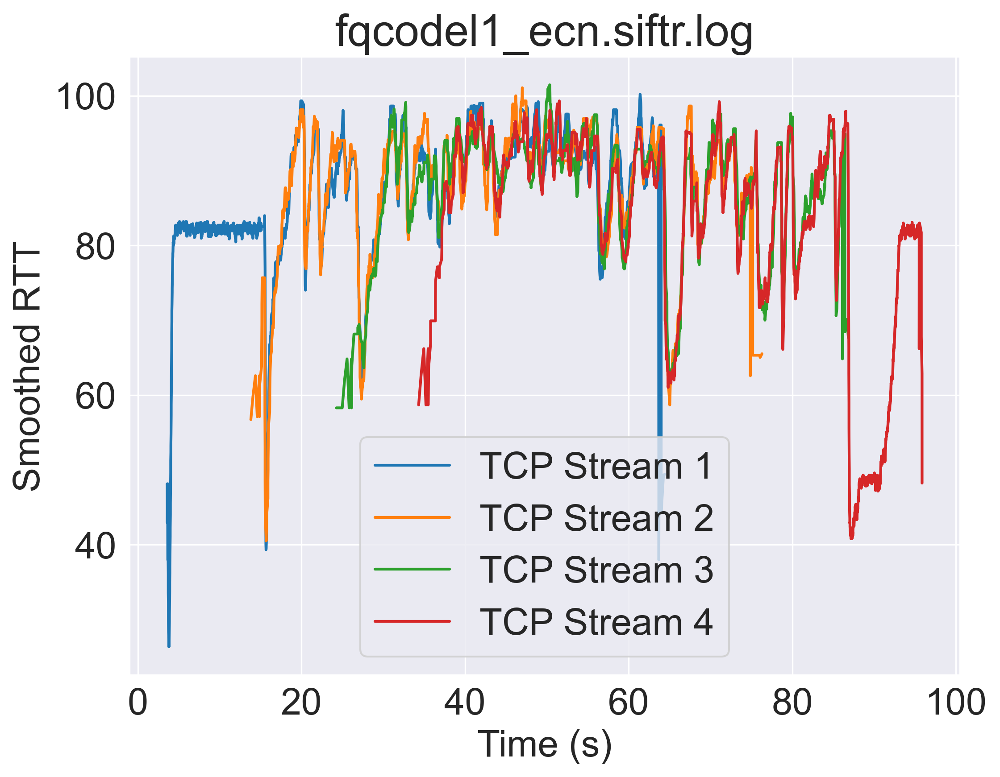

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


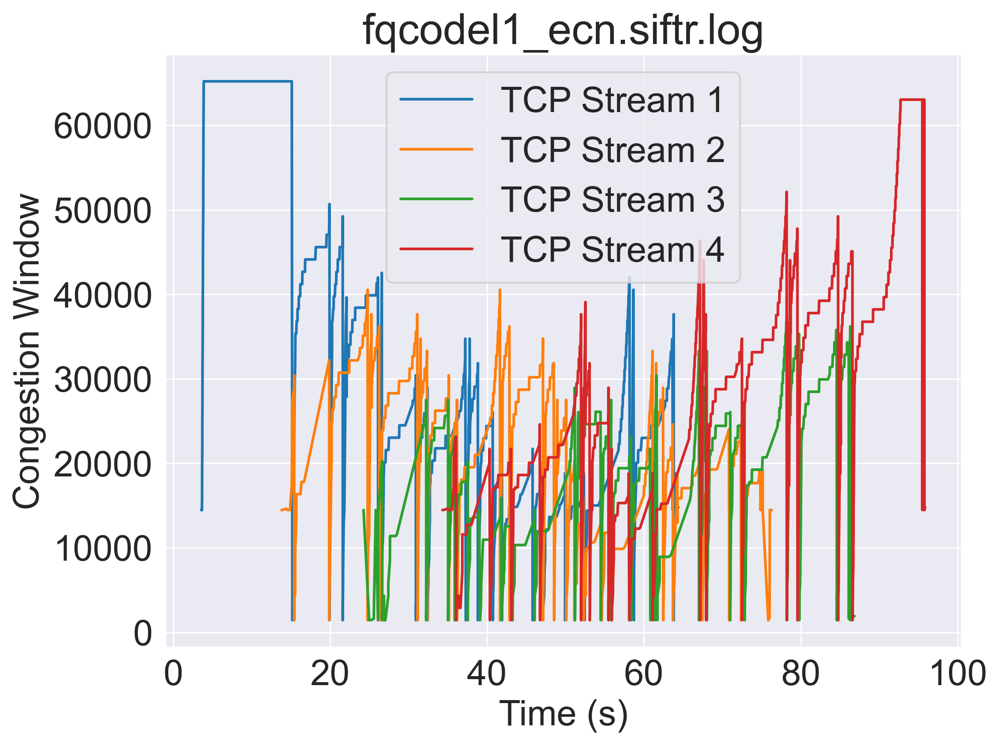

fqcodel1_noecn.siftr.log
count    2379.000000
mean       81.540749
std        16.343403
min        44.042812
25%        77.343750
50%        86.620937
75%        94.238125
max       100.292812
Name: SmoothedRTT, dtype: float64
5899    64.941250
5900    64.941250
5955    67.773438
5956    67.773438
6028    70.703125
Name: SmoothedRTT, dtype: float64
18403    71.289062
18423    66.308437
18425    66.308437
18426    66.308437
18440    58.886562
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


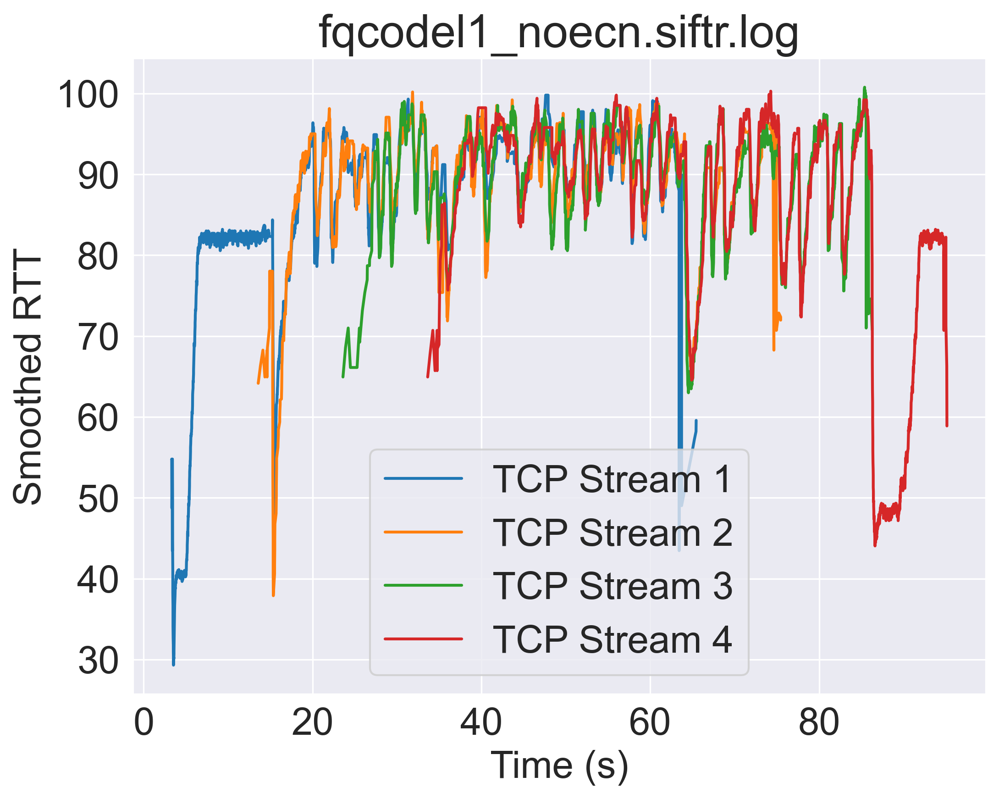

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


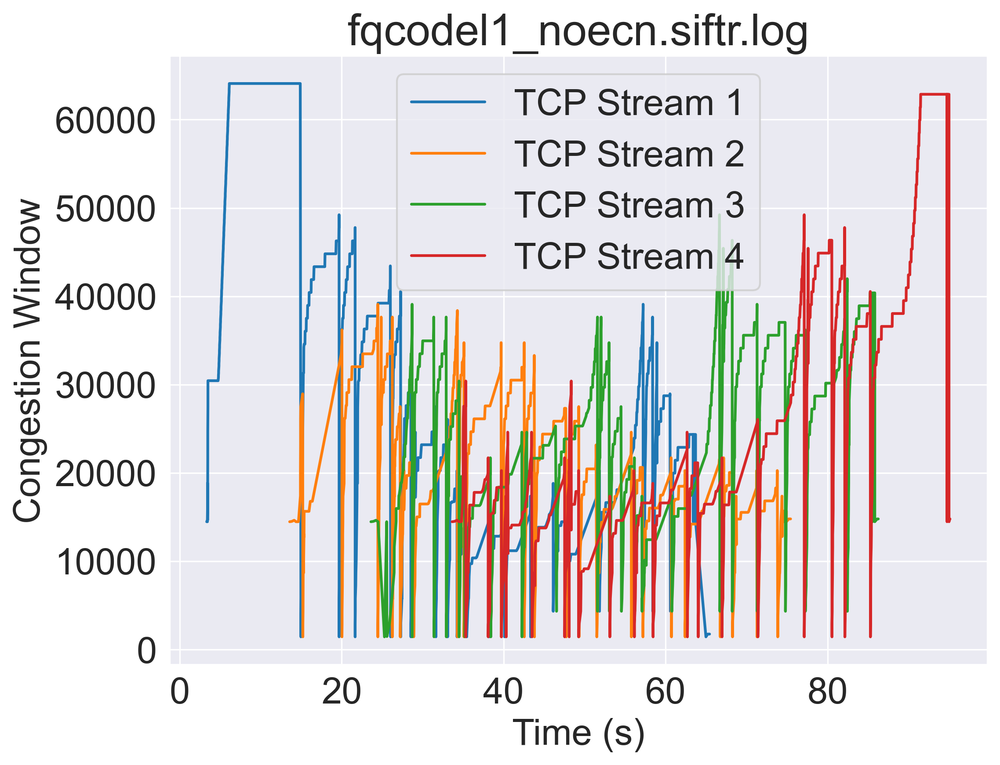

fqcodel2_ecn.siftr.log
count    2637.000000
mean       79.763300
std        15.474257
min        45.117188
25%        72.265625
50%        82.617188
75%        92.382812
max       101.953125
Name: SmoothedRTT, dtype: float64
5956    61.035000
5957    61.035000
6012    64.745937
6013    64.745937
6078    68.066250
Name: SmoothedRTT, dtype: float64
18547    69.726562
18567    64.550625
18569    64.550625
18570    64.550625
18582    57.324062
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


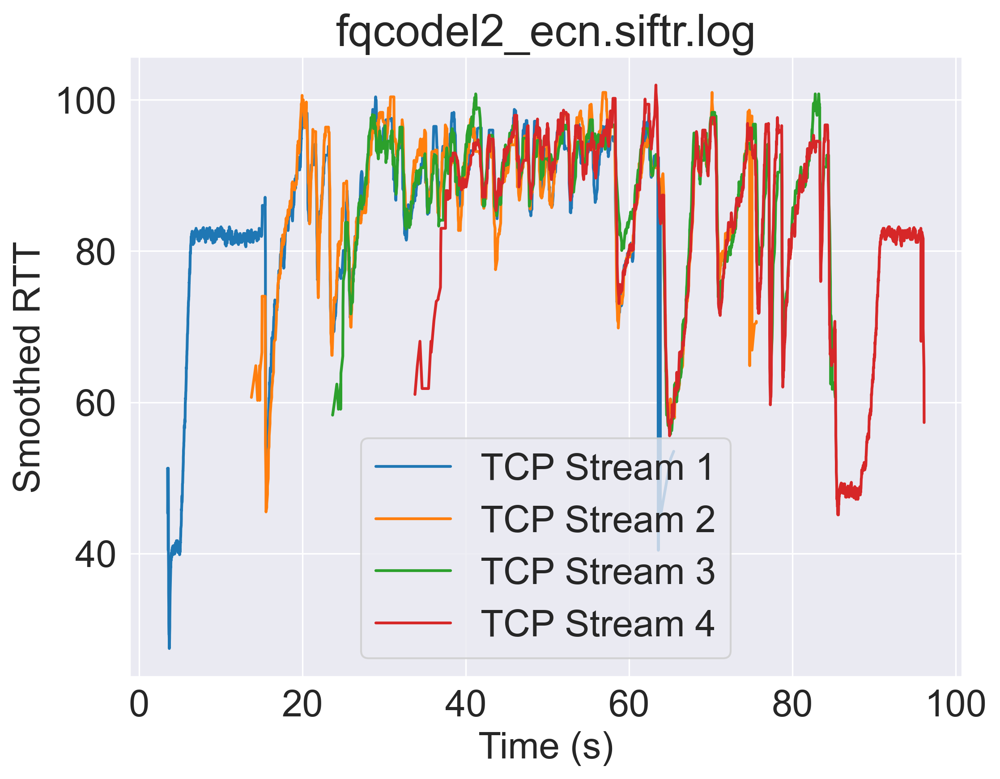

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


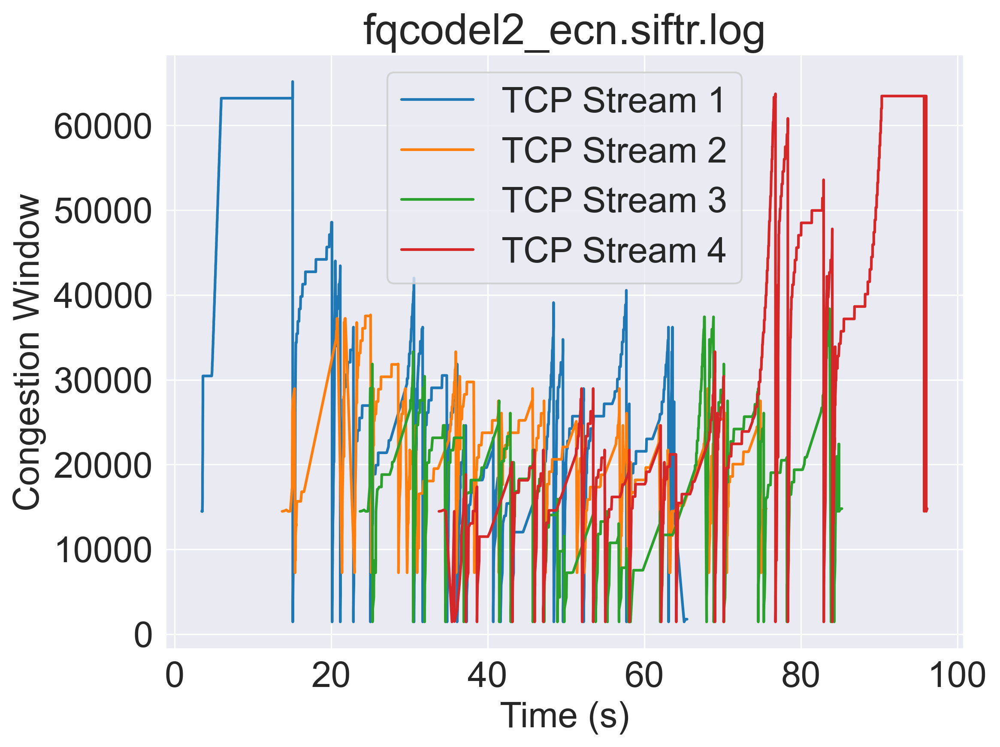

fqcodel2_noecn.siftr.log
count    2698.000000
mean       79.460948
std        15.482779
min        44.726562
25%        64.745937
50%        85.156250
75%        92.968750
max       100.488125
Name: SmoothedRTT, dtype: float64
5800    66.796875
5801    66.796875
5858    69.824062
5859    69.824062
5925    72.460938
Name: SmoothedRTT, dtype: float64
18453    73.242188
18455    73.242188
18456    73.242188
18460    64.160000
18462    56.152187
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


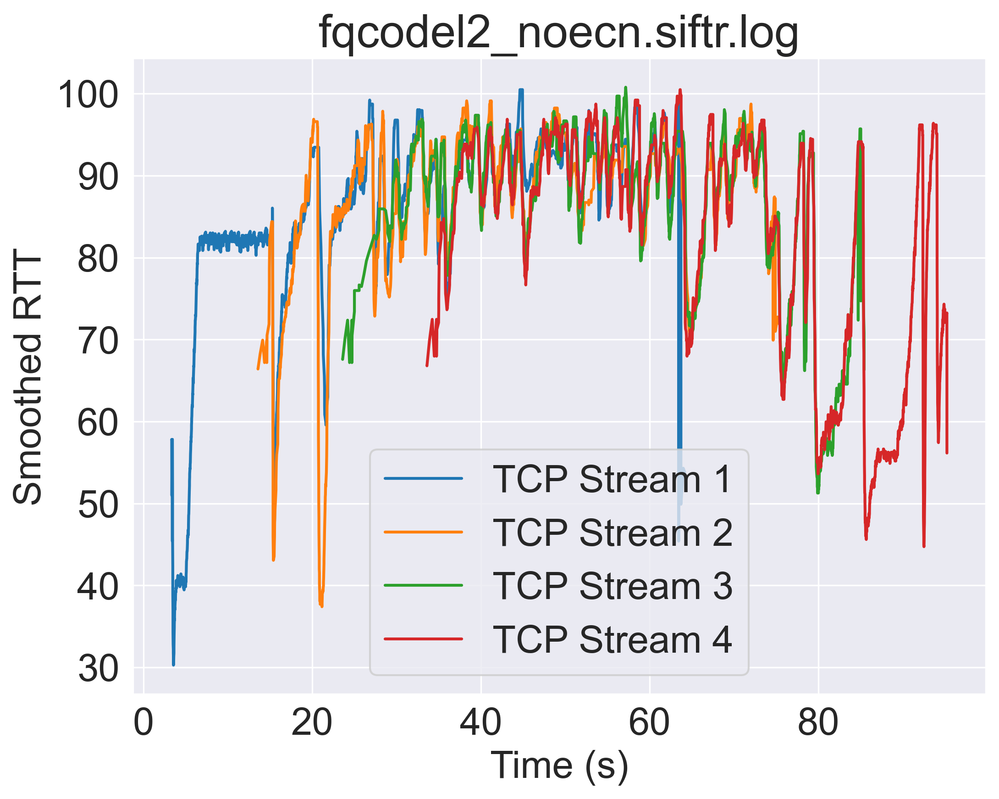

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


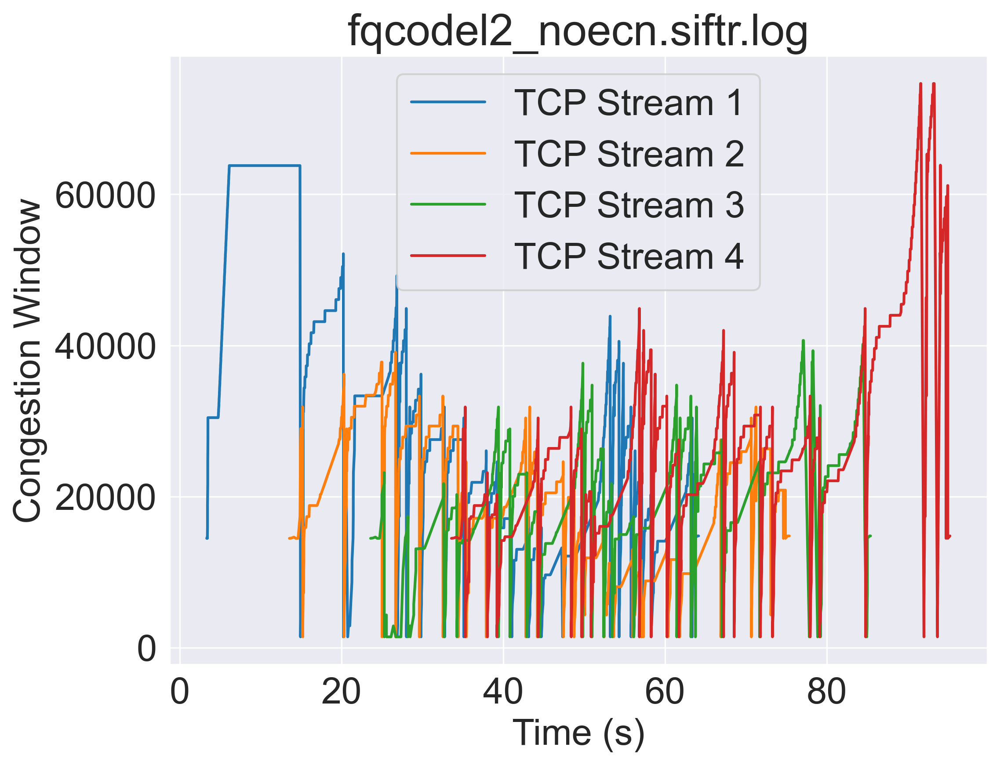

fqpie1_ecn.siftr.log
count    2365.000000
mean       78.623650
std        16.765670
min        41.210938
25%        64.453125
50%        82.617188
75%        93.554688
max        99.902187
Name: SmoothedRTT, dtype: float64
5974    64.648438
5977    64.648438
6044    67.968750
6045    67.968750
6126    69.628750
Name: SmoothedRTT, dtype: float64
18416    70.312500
18436    65.429688
18438    65.429688
18439    65.429688
18451    58.105312
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


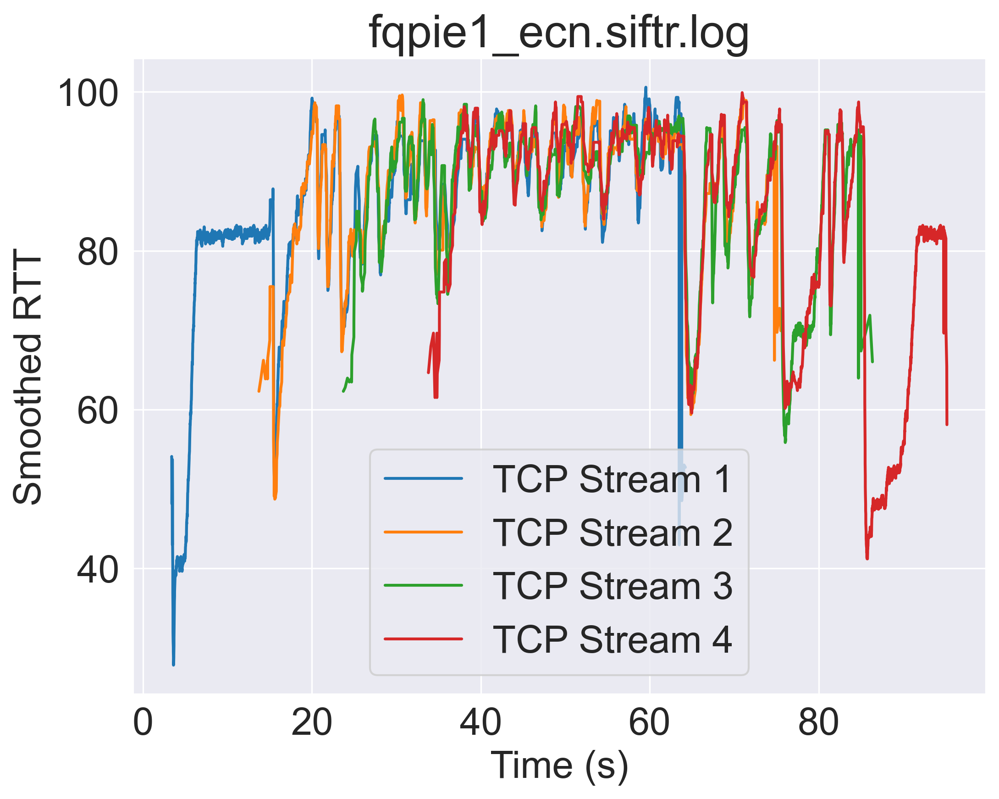

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


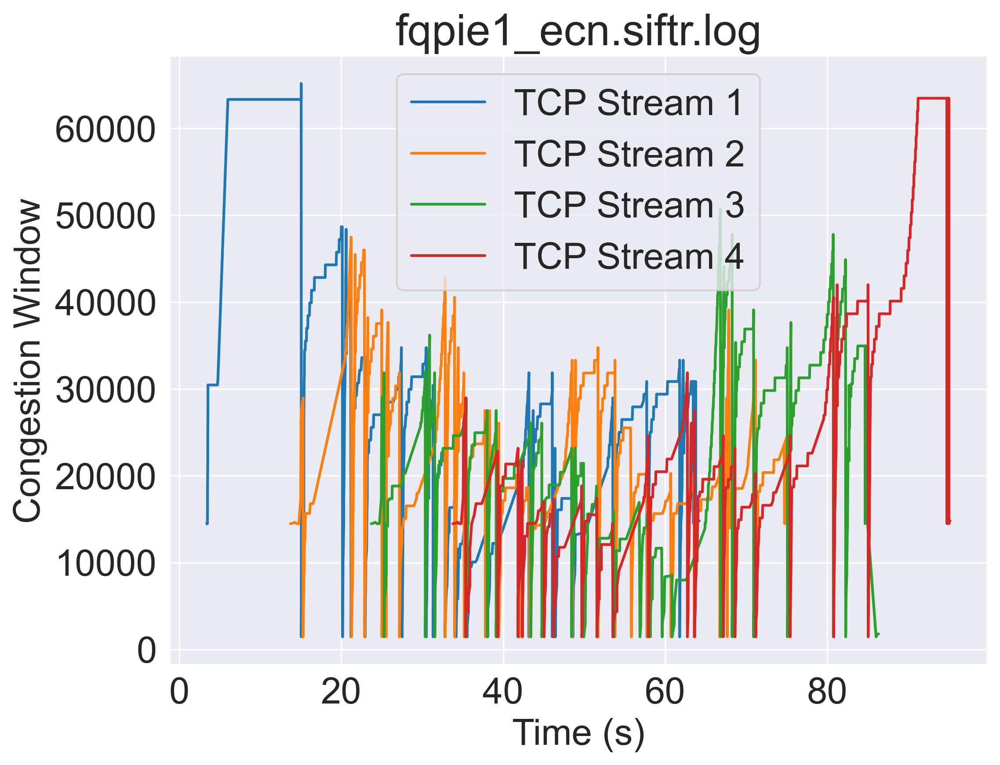

fqpie1_noecn.siftr.log
count    2331.000000
mean       84.549540
std         9.835877
min        44.433437
25%        81.542812
50%        83.007812
75%        93.066250
max       100.292812
Name: SmoothedRTT, dtype: float64
6079    65.625000
6080    65.625000
6147    69.140625
6148    69.140625
6221    70.312500
Name: SmoothedRTT, dtype: float64
18524    72.460938
18562    71.289062
18564    71.289062
18565    71.289062
18572    62.402187
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


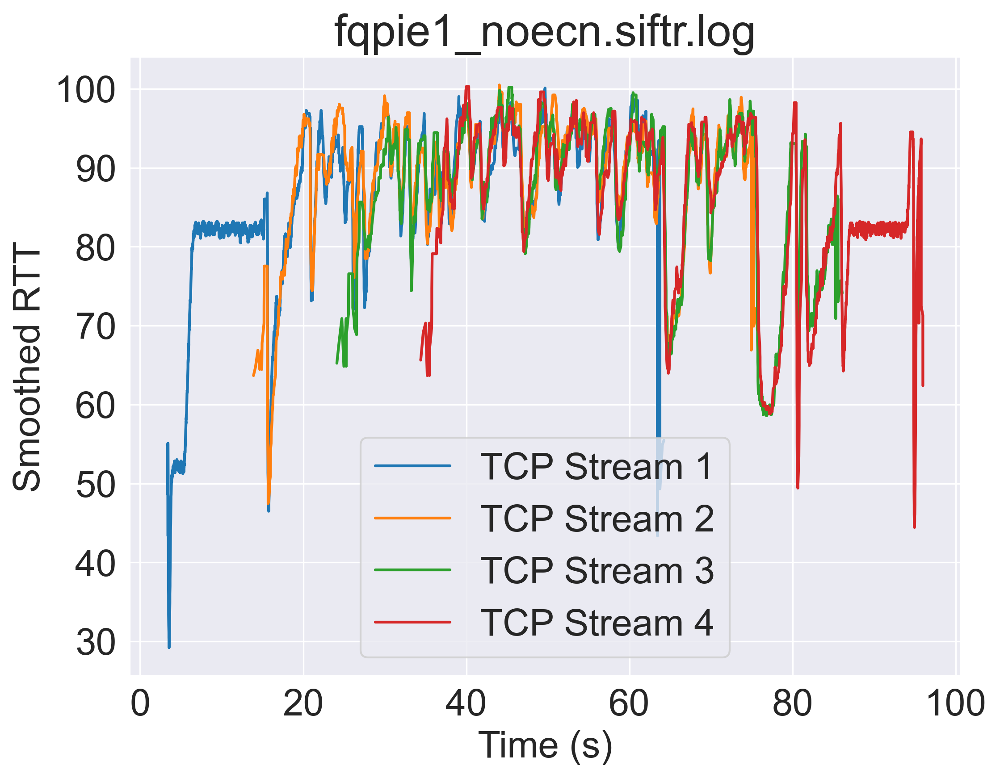

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


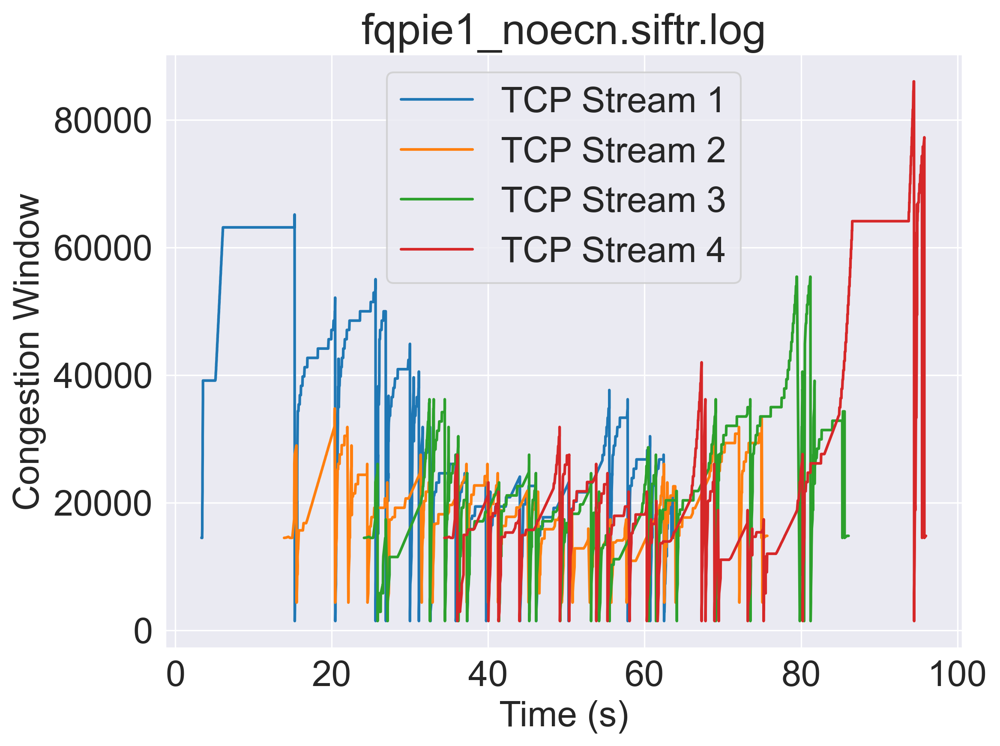

fqpie2_ecn.siftr.log
count    2624.000000
mean       81.574264
std        14.376381
min        43.359375
25%        78.100547
50%        82.714687
75%        93.261562
max        99.609375
Name: SmoothedRTT, dtype: float64
5900    66.015625
5903    66.015625
5959    68.750000
5960    68.750000
6023    71.093750
Name: SmoothedRTT, dtype: float64
18454    72.753750
18456    72.753750
18457    72.753750
18461    63.671875
18463    55.761562
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


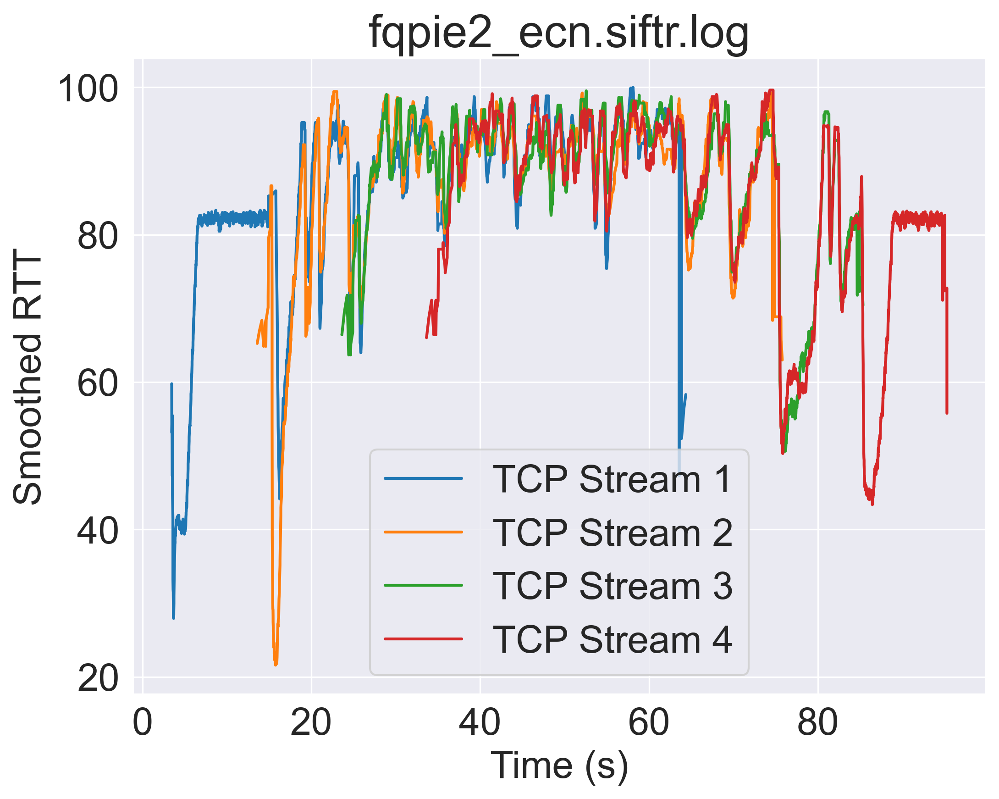

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


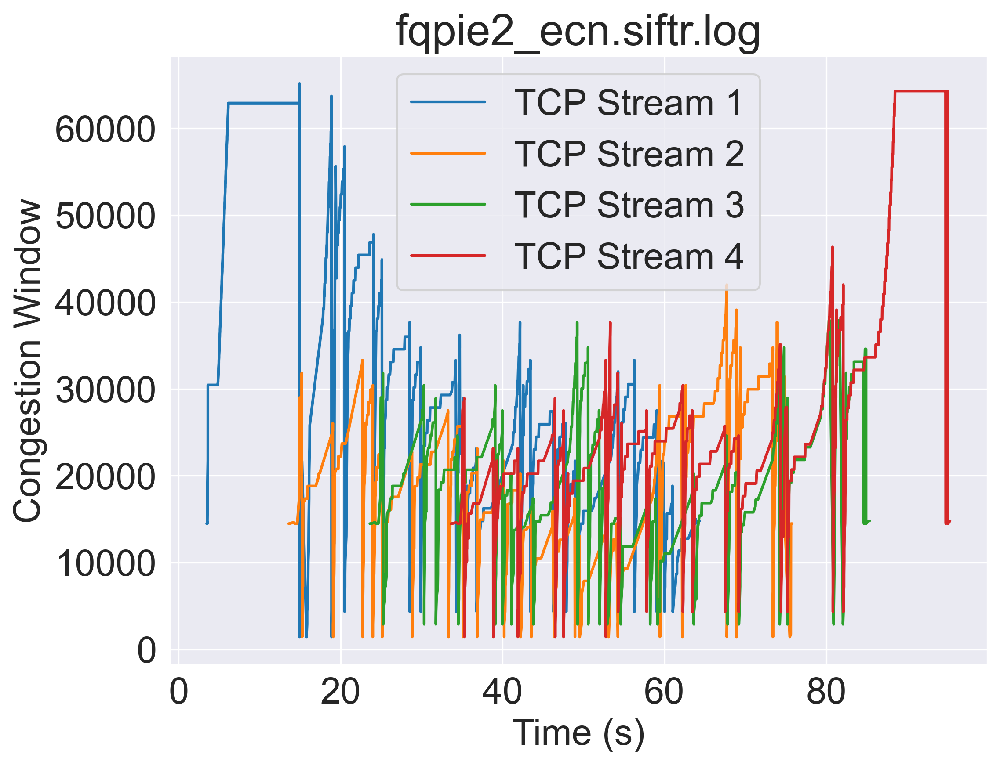

fqpie2_noecn.siftr.log
count    2483.000000
mean       81.610928
std        14.236048
min        41.992188
25%        72.705000
50%        86.425625
75%        93.359375
max        99.511562
Name: SmoothedRTT, dtype: float64
5908    71.191250
5911    71.191250
5979    72.460938
5980    72.460938
6040    72.460938
Name: SmoothedRTT, dtype: float64
18440    72.851562
18488    73.535000
18490    73.535000
18491    73.535000
18497    64.355312
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


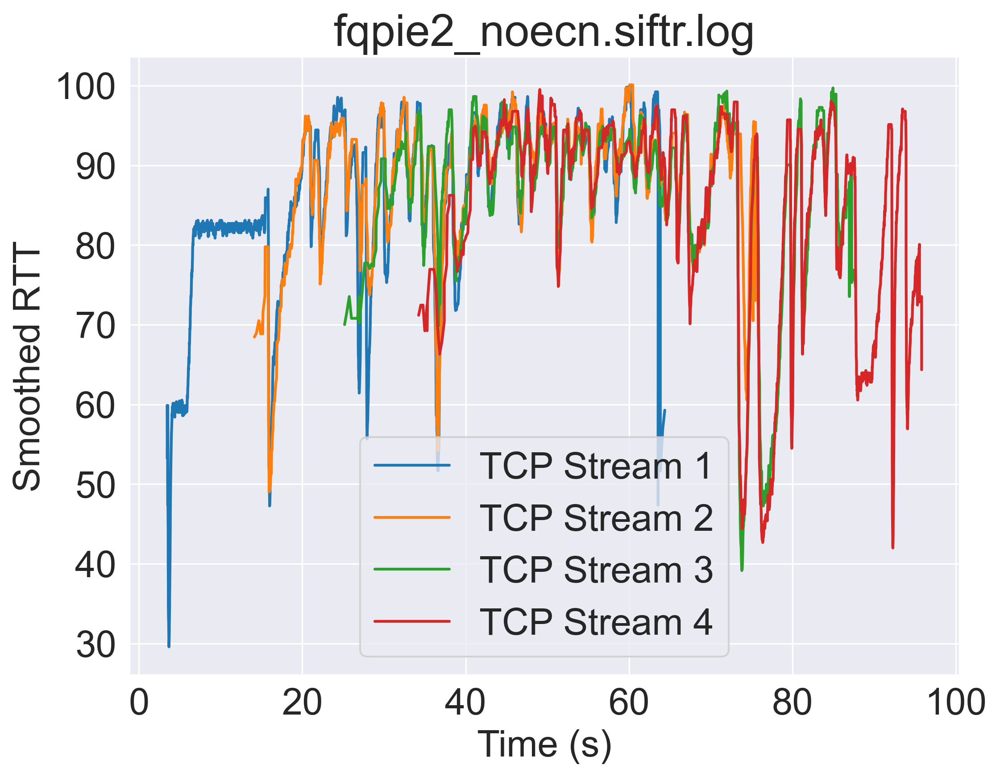

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


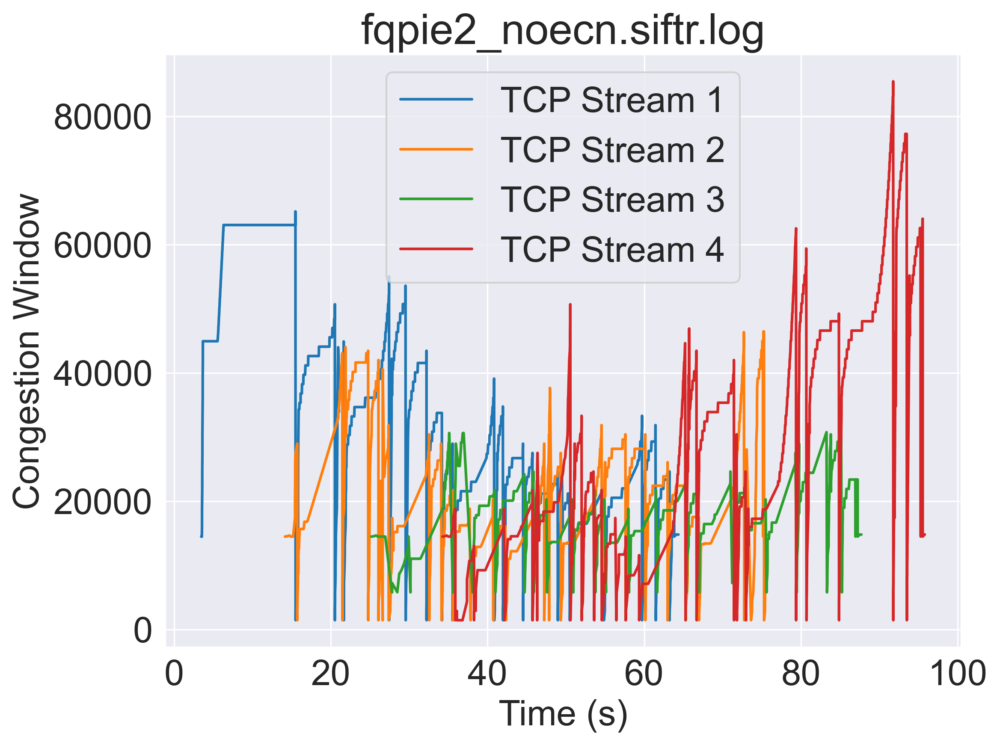

l4s1_ecn.siftr.log
count    6077.000000
mean       53.923393
std        19.546181
min        29.882812
25%        38.378750
50%        48.535000
75%        62.597500
max       125.781250
Name: SmoothedRTT, dtype: float64
10825    37.5
10826    37.5
10871    37.5
10872    37.5
10968    37.5
Name: SmoothedRTT, dtype: float64
37545    37.109375
37558    37.206875
37560    37.206875
37561    37.206875
37575    37.304688
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


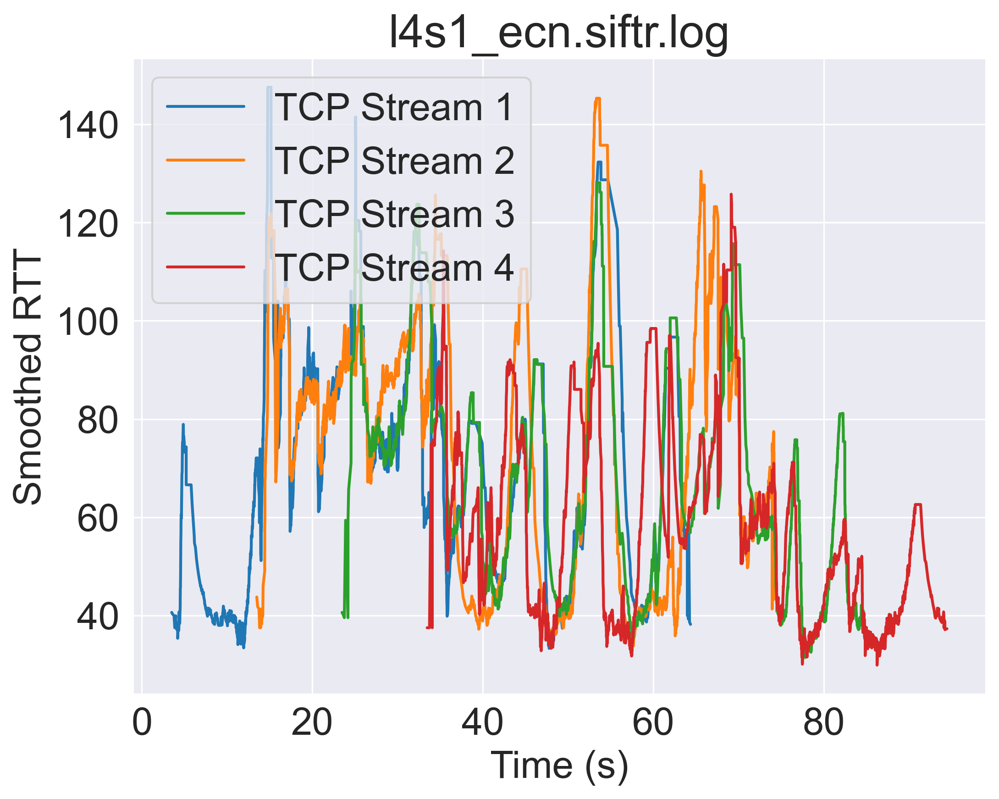

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


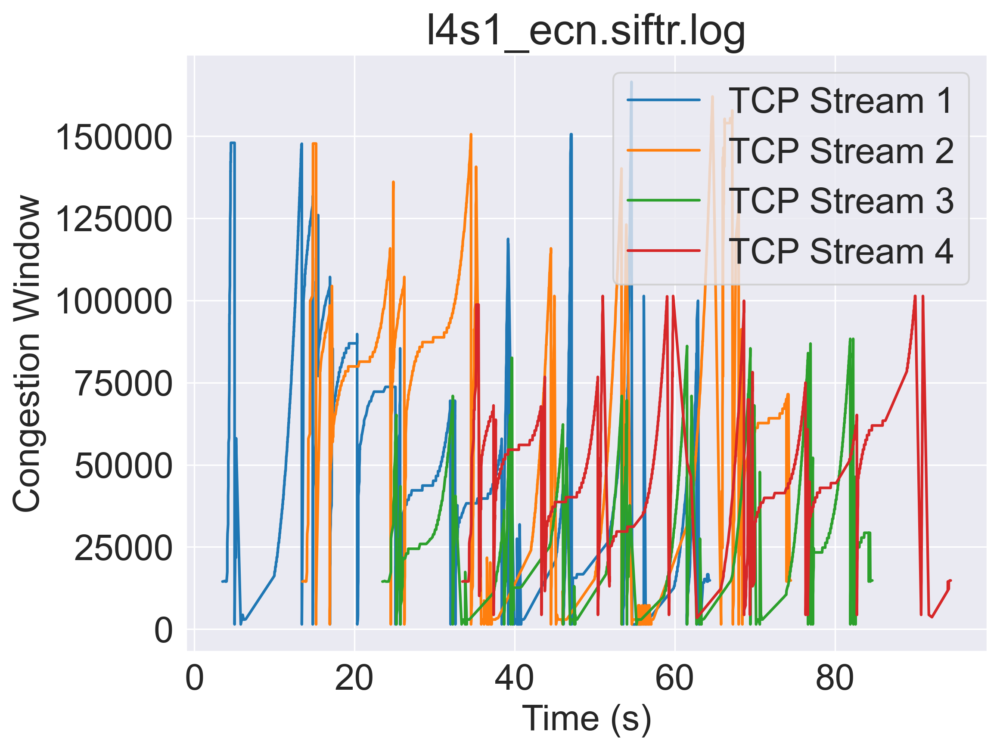

l4s1_noecn.siftr.log
count    3439.000000
mean       62.351631
std        21.617456
min        31.445312
25%        43.847500
50%        59.277187
75%        75.000000
max       120.800625
Name: SmoothedRTT, dtype: float64
10563    74.511562
10564    74.511562
10667    73.828125
10668    73.828125
10780    73.242188
Name: SmoothedRTT, dtype: float64
34391    63.085938
34393    63.085938
34394    63.085938
34411    59.570312
34413    56.445312
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


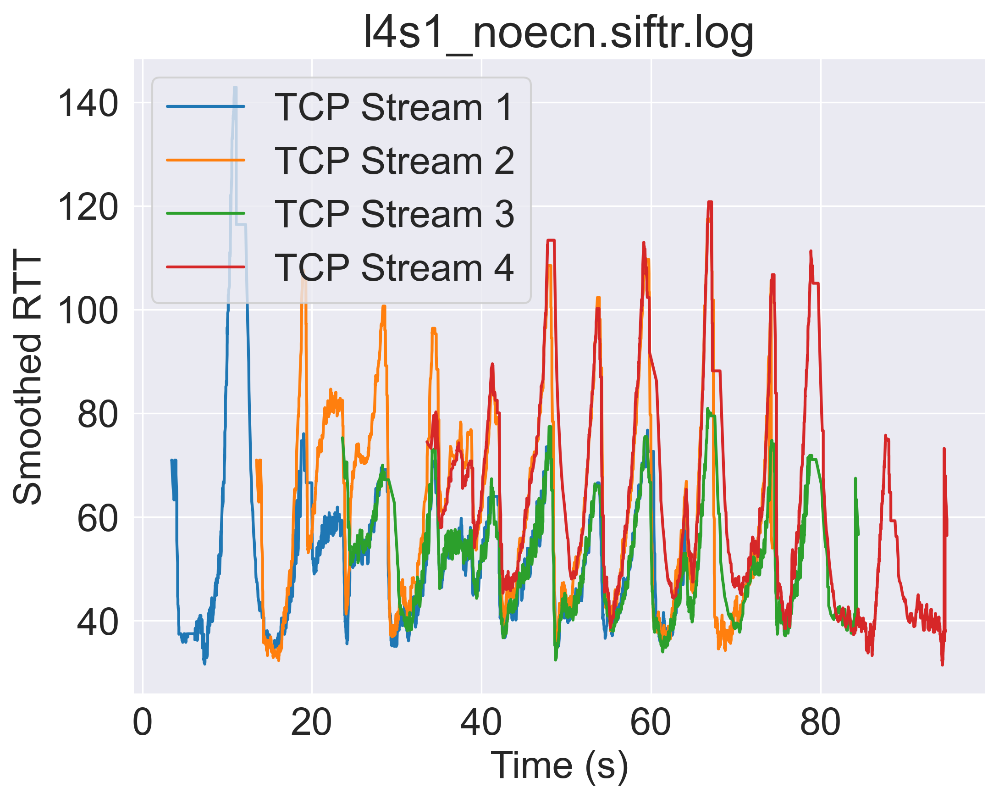

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


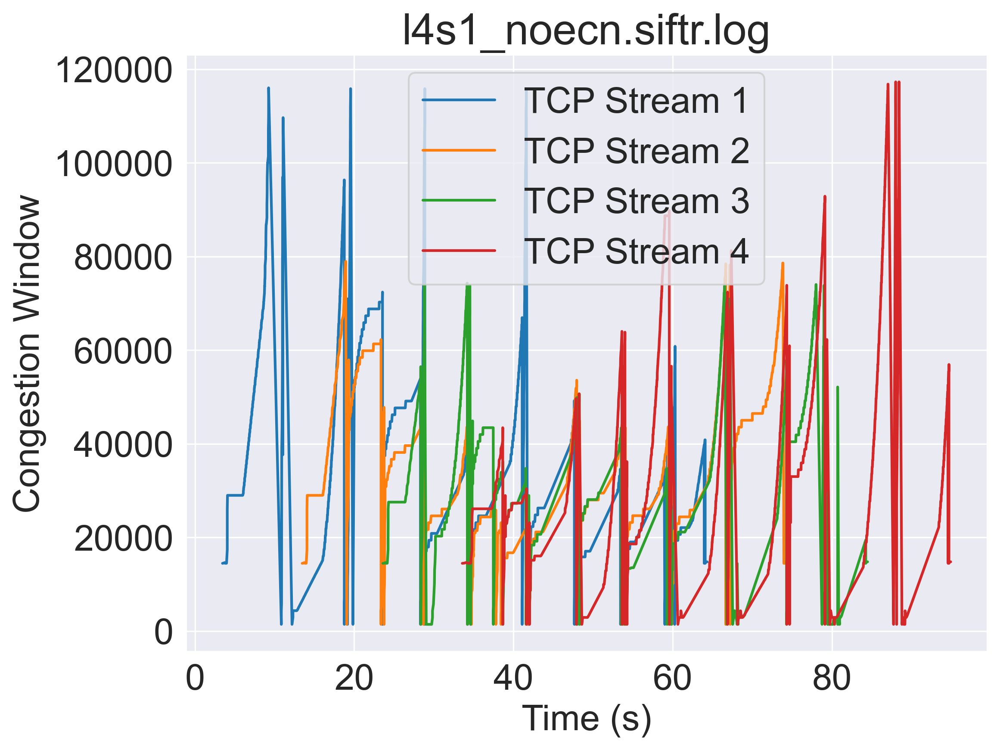

l4s2_ecn.siftr.log
count    690.000000
mean     134.397149
std       53.113768
min       50.000000
25%       96.581875
50%      119.824062
75%      171.411094
max      303.515625
Name: SmoothedRTT, dtype: float64
1690    52.343750
1695    52.343750
1732    72.363125
1733    72.363125
1775    96.581875
Name: SmoothedRTT, dtype: float64
4969    88.476562
4975    81.738125
4977    81.738125
4978    81.738125
4990    76.269375
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


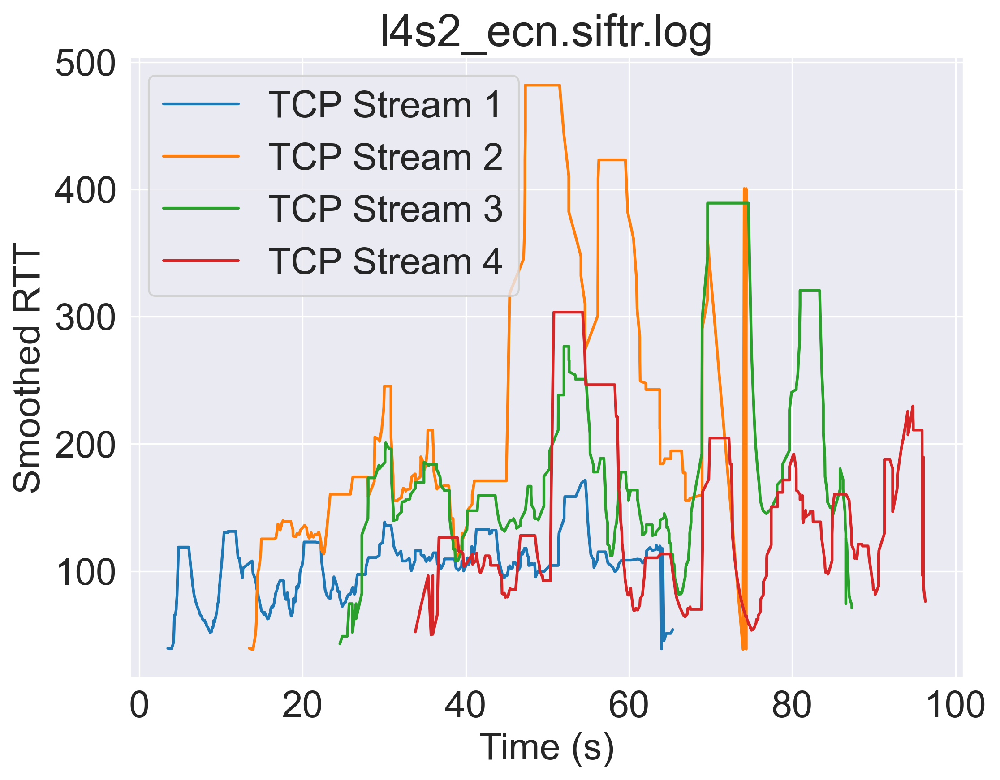

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


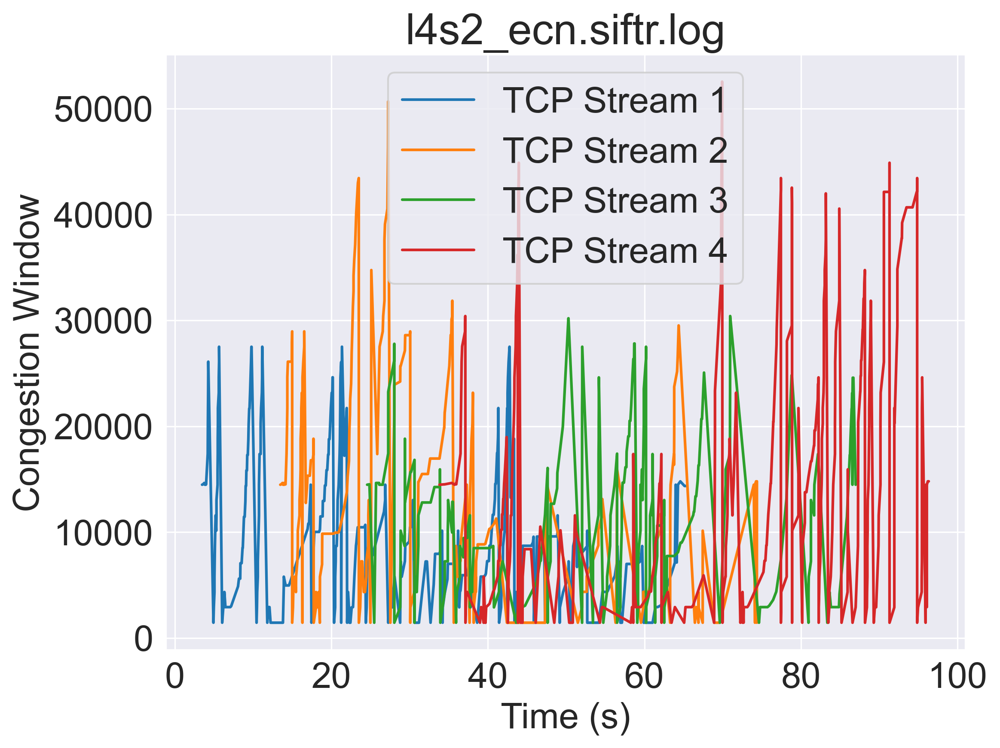

l4s2_noecn.siftr.log
count    629.000000
mean     143.719329
std       41.768196
min       54.296875
25%      119.824062
50%      146.289062
75%      167.870937
max      256.738125
Name: SmoothedRTT, dtype: float64
1841    56.542812
1842    56.542812
1854    54.589687
1855    54.589687
1875    66.210938
Name: SmoothedRTT, dtype: float64
5296    70.507812
5302    66.406250
5304    66.406250
5305    66.406250
5319    62.792812
Name: SmoothedRTT, dtype: float64


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


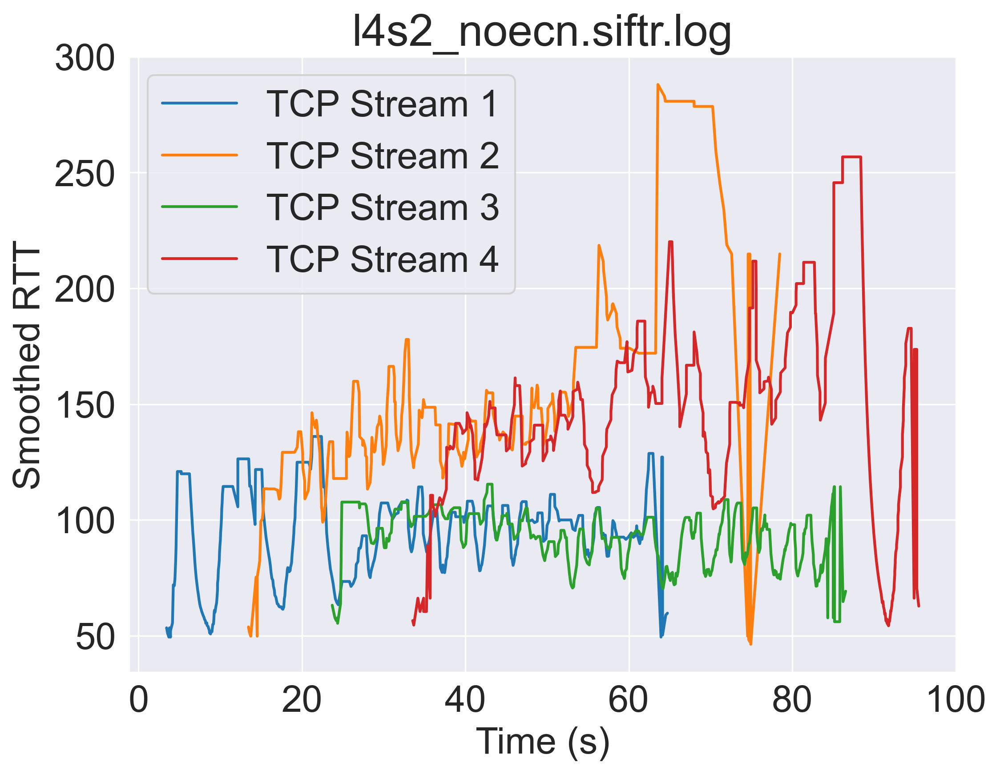

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


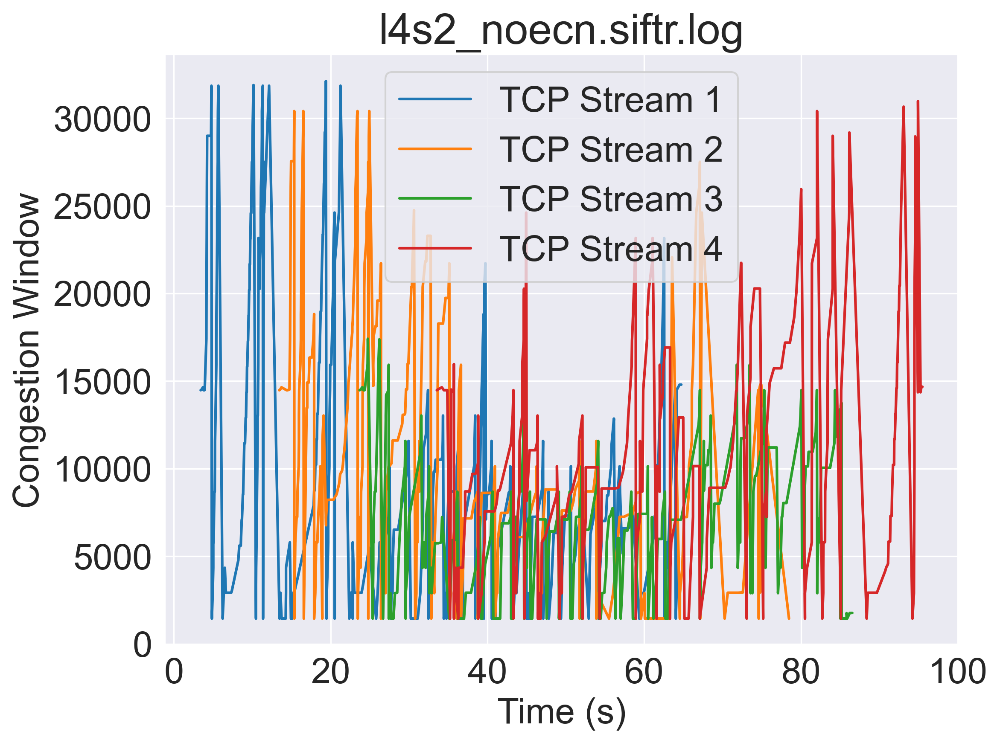

In [92]:
dataframe_list=[]
data_filename_list=[]
data_dict={}
for index in range(len(filenames)):
    # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
    data = []
    with open("./datatest1/"+filenames[index], 'r') as f:
        # store the data
        for line in f:
            tem = re.sub(r'\s', '', line)
            data.append(tem.split(','))
    # remove file line of data
    print(filenames[index])
    data.pop(0)
    data.pop(len(data)-1)

    # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
    # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
    enable_time_secs = 1716792031
    enable_time_usecs = 61770
    siftver = '1.2.4'
    hz = 100
    tcp_rtt_scale = 32
    sysname = 'FreeBSD'
    sysver = 1301000
    ipmode = 4



    df = pd.DataFrame(data, columns=col)

    df=df[df['Direction']=='o']

    # congestion window to int
    df = df.astype({'CongestionWindow': 'int32'})
    
    # Convert 'Time' column to float64 type
    df['Time'] = df['Time'].astype('float64')

    # Subtract the first time entry from all the entries in 'Time' column
    df['Time'] = df['Time'] - df['Time'].iloc[0]



    # remove rows that congestion window bigger than 70000
    # df = df[df['CongestionWindow'].astype(int) < 70000]
    # RTT divide by tcp_rtt_scale * hz
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
    df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
    df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')

    



    # first path ForeignPort = 5101
    dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

    # second path localip = 5102
    dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

    # third path ForeignPort = 5101
    dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

    # fourth path localip = 5102
    dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
    # data_filename_list.append(filenames[index])
    # dataframe_list.append(dfPath1.copy())
    # data_dict[filenames[index]]=dfPath1.copy()
    print(dfPath4['SmoothedRTT'].describe())
    print(dfPath4['SmoothedRTT'].head(5))
    print(dfPath4['SmoothedRTT'].tail(5))

    # Darker color-blind-friendly palette
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    # Different line styles and markers
    line_styles = ['-', '--', '-.', ':']
    #line_styles = ['-', '-', '-', '-']
    markers = ['o', 's', '^', 'D']

    


    

    # Plot Smoothed RTT vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid

    
    # plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    
    plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Smoothed RTT')
    plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_SmoothedRTT.eps", dpi=300,bbox_inches='tight')
    plt.show()

    dfpath1_filtered = remove_outliers_iqr(dfPath1,"CongestionWindow")
    dfpath2_filtered = remove_outliers_iqr(dfPath2,"CongestionWindow")
    dfpath3_filtered = remove_outliers_iqr(dfPath3,"CongestionWindow")
    dfpath4_filtered = remove_outliers_iqr(dfPath4,"CongestionWindow")

    # Plot CWND vs Time
    #plt.figure(figsize=(7, 4.5))  # Set the figure size to fit within the column width
    plt.rcParams.update({'figure.figsize':(8,6), 'figure.dpi':300, 'font.size':20})
    sns.set_style("darkgrid")  # Set the style to darkgrid



    
   
    # plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
    #              color=colors[0], linestyle=line_styles[0])
    # plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
    #              color=colors[1], linestyle=line_styles[1])
    # plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
    #              color=colors[2], linestyle=line_styles[2])
    # plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
    #              color=colors[3], linestyle=line_styles[3])
    

    plt.plot(dfpath1_filtered['Time'], dfpath1_filtered['CongestionWindow'], label='TCP Stream 1',
                 color=colors[0])
    plt.plot(dfpath2_filtered['Time'], dfpath2_filtered['CongestionWindow'], label='TCP Stream 2',
                 color=colors[1])
    plt.plot(dfpath3_filtered['Time'], dfpath3_filtered['CongestionWindow'], label='TCP Stream 3',
                 color=colors[2])
    plt.plot(dfpath4_filtered['Time'], dfpath4_filtered['CongestionWindow'], label='TCP Stream 4',
                 color=colors[3])
    
    plt.xlabel('Time (s)')
    plt.ylabel('Congestion Window')
    plt.title(filenames[index])
    plt.legend()
    plt.grid(True)
    # plt.savefig("./iperf3_tests/"+title+"-"+"Graphs.png", dpi=100,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.png", dpi=300,bbox_inches='tight')
    plt.savefig("./Graphs/"+filenames[index]+"_CWND.eps", dpi=300,bbox_inches='tight')
    plt.show()
    


In [93]:
# dataframe_list=[]
# data_filename_list=[]
# data_dict={}
# for index in range(len(filenames)):
#     # open d:/work/mptcp/twopathMPdata/test1/twopathtype1.siftr.log
#     data = []
#     with open("./datatest1/"+filenames[index], 'r') as f:
#         # store the data
#         for line in f:
#             tem = re.sub(r'\s', '', line)
#             data.append(tem.split(','))
#     # remove file line of data
#     data.pop(0)
#     data.pop(len(data)-1)

#     # define variables from enable_time_secs=1716792031	enable_time_usecs=061770	
#     # siftrver=1.2.4 hz=100	tcp_rtt_scale=32	sysname=FreeBSD	sysver=1301000	ipmode=4
#     enable_time_secs = 1716792031
#     enable_time_usecs = 61770
#     siftver = '1.2.4'
#     hz = 100
#     tcp_rtt_scale = 32
#     sysname = 'FreeBSD'
#     sysver = 1301000
#     ipmode = 4



#     df = pd.DataFrame(data, columns=col)

#     # congestion window to int
#     df = df.astype({'CongestionWindow': 'int32'})
    
#     # Convert 'Time' column to float64 type
#     df['Time'] = df['Time'].astype('float64')

#     # Subtract the first time entry from all the entries in 'Time' column
#     df['Time'] = df['Time'] - df['Time'].iloc[0]



#     # remove rows that congestion window bigger than 70000
#     # df = df[df['CongestionWindow'].astype(int) < 70000]
#     # RTT divide by tcp_rtt_scale * hz
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')
#     df['SmoothedRTT'] = df['SmoothedRTT'] / (tcp_rtt_scale * hz)
#     df['SmoothedRTT'] = df['SmoothedRTT'].astype('float64')



#     # first path ForeignPort = 5101
#     dfPath1 = df.loc[(df['ForeignPort'] == '5101')]

#     # second path localip = 5102
#     dfPath2 = df.loc[(df['ForeignPort'] == '5102')]

#     # third path ForeignPort = 5101
#     dfPath3 = df.loc[(df['ForeignPort'] == '5103' )]

#     # fourth path localip = 5102
#     dfPath4 = df.loc[(df['ForeignPort'] == '5104')]
    
#     # data_filename_list.append(filenames[index])
#     # dataframe_list.append(dfPath1.copy())
#     # data_dict[filenames[index]]=dfPath1.copy()
#     print(dfPath4['SmoothedRTT'].describe())
#     print(dfPath4['SmoothedRTT'].head(5))
#     print(dfPath4['SmoothedRTT'].tail(5))


    

#     # Plot Smoothed RTT vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['SmoothedRTT'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['SmoothedRTT'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['SmoothedRTT'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['SmoothedRTT'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Smoothed RTT')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

#     # Plot CWND vs Time
#     plt.figure(figsize=(10, 6))
#     plt.plot(dfPath1['Time'], dfPath1['CongestionWindow'], label='TCP Stream 1')
#     plt.plot(dfPath2['Time'], dfPath2['CongestionWindow'], label='TCP Stream 2')
#     plt.plot(dfPath3['Time'], dfPath3['CongestionWindow'], label='TCP Stream 3')
#     plt.plot(dfPath4['Time'], dfPath4['CongestionWindow'], label='TCP Stream 4')
#     plt.xlabel('Time (s)')
#     plt.ylabel('Congestion Window')
#     plt.title(filenames[index])
#     plt.legend()
#     plt.grid(True)
#     plt.show()

    
#     break;
    


In [94]:
for i in range(len(col)):
    print(i,end=",")
    print(col[i])


0,Direction
1,Time
2,LocalIP
3,LocalPort
4,ForeignIP
5,ForeignPort
6,SlowStartThreshold
7,CongestionWindow
8,t_flags2
9,SendingWindow
10,ReceiveWindow
11,SendingWindowScalingFactor
12,ReceiveWindowScalingFactor
13,TCPFiniteStateMachine
14,MaximumSegmentSize
15,SmoothedRTT
16,SACKEnabled
17,TCPFlags
18,RetransmissionTimeout
19,SocketSendBufferSize
20,SocketSendBufferBytes
21,SocketReceiveBufferSize
22,SocketReceiveBufferBytes
23,UnacknowledgedBytes
24,ReassemblyQueue
25,Flowid
26,Flowtype
